In [2]:
import math
import pandas as pd
import numpy as np
from scipy.integrate import odeint
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
from datetime import datetime
from sindy_rl_functions_ema import *

In [2]:
#sindy analysis

from matplotlib.pylab import LinAlgError


folds = 1
collect = ['CR', 'EV', 'PE', 'H', 'Cl', 'Cc']

controlvarslist = [['dCR4', 'dCR6', 'dCR8', 'dEV4', 'dEV6', 'dEV8', 'dPE4', 'dPE6', 'dPE8'], ['dCR4', 'dCR6', 'dCR8', 'dEV4', 'dEV6', 'dEV8', 'dPE4', 'dPE6', 'dPE8', 'dH4', 'dH6', 'dH8'], ['dCR4', 'dCR6', 'dCR8', 'dEV4', 'dEV6', 'dEV8', 'dPE4', 'dPE6', 'dPE8', 'Cl1'], ['dCR4', 'dCR6', 'dCR8', 'dEV4', 'dEV6', 'dEV8', 'dPE4', 'dPE6', 'dPE8', 'Cl1', 'Cc1'], ['dCR4', 'dCR6', 'dCR8', 'dEV4', 'dEV6', 'dEV8', 'dPE4', 'dPE6', 'dPE8', 'dH4', 'dH6', 'dH8', 'Cl1', 'Cc1']]
r2lists = []


for i in range(0,5):
     occurences = [0 for i in collect]
     occurences.append(0)
     occurences.append(0)
     

     myvar = ['happiness rating']


     controlvars = controlvarslist[i]


          
          
     qvalslist = []
     control_inputs_training = []
     participants= []

     data = pd.read_csv('GBE_final.csv')

     data = data[data['attempt number'] < 2]
     data.dropna(subset=['happiness rating'], inplace=True)
     list_df2 = []
     for i in range (1, 50000):
          df1 = data[data['participant'] == i]
          if len(df1) > 0:
               list_df2.append(df1)
               participants.append(i)
     for df in list_df2:
          control_inputs_training.append(np.array(df[controlvars])[0:])
          qvalslist.append(np.array(df[myvar])[0:])


     generalized_library, feat_names = SINDYlibrary(myvar, controlvars)
     print(feat_names)
     repeats = []
     exceptionlist = []
     coefficient_totals=[[] for i in collect]

     # print(qvalslist[932])
     # print(control_inputs_training[932])


     r2list = []

     for i in range (0,16337):

     
     #excluding participants with more than 6 consecutive identical happiness ratings
          save = -1
          count = 1
          good = True
          for num in qvalslist[i]:
               if count > 6:
                    #was 3 before
                    good = False
                    repeats.append(i)
                    break
               elif num == save:
                    count += 1
               else:
                    count = 1
                    save = num

          if good:
               print(i)
          
               newQ = []
               newC = []
               newQ.append(qvalslist[i])
               newC.append(control_inputs_training[i])

               test = [i for i, x in enumerate(newQ)]
               np.random.seed(100)
               np.random.shuffle(test)

               holdoutsize = 0

               print(len(qvalslist))
               for kfold in range(0, folds):
                    leaveout = [] # test[kfold*holdoutsize:(kfold+1)*holdoutsize]
                    try:
                         model, r2, coefficients = testSINDy(newQ, newC,
                                        generalized_library, feat_names, leaveout=leaveout, testing=True, runs=1, errperc=0.005, collect=collect)
                         r2list.append(r2)
                         totals = coefficients[0]
                         values = coefficients[1]
                         for i in range(0, len(totals)):
                              if(totals[i] == True):
                                   occurences[i] += 1
                         for i in range(0, len(values)):
                              coefficient_totals[i].append(values[i])
                     

                    except LinAlgError:
                         exceptionlist.append(i)
                         continue
     r2lists.append(r2list)
          


['happiness rating', 'dCR4', 'dCR6', 'dCR8', 'dEV4', 'dEV6', 'dEV8', 'dPE4', 'dPE6', 'dPE8']
0
16337
R^2 = 0.3072883599732058
(happiness rating)' = 0.244 dCR4 + -0.125 dCR8 + 0.096 dEV4 + 0.128 dPE6
1
16337
R^2 = 0.2791093591792212
(happiness rating)' = -0.120 dCR4 + 0.084 dCR6 + 0.248 dCR8 + -0.056 dPE4 + 0.032 dPE8
2
16337
R^2 = 0.373875400459477
(happiness rating)' = 0.140 dCR6 + -0.090 dEV8 + -0.193 dPE4 + -0.094 dPE6 + 0.131 dPE8
3
16337
R^2 = 0.2940212105684106
(happiness rating)' = -0.046 dCR4 + 0.045 dCR8 + 0.025 dEV4 + -0.055 dEV8 + -0.042 dPE4 + 0.072 dPE8
4
16337
R^2 = 0.5262276834321166
(happiness rating)' = 0.299 dCR8 + -0.032 dEV4 + 0.078 dEV8 + -0.109 dPE4 + 0.095 dPE8
5
16337
R^2 = 0.4901747447912046
(happiness rating)' = -0.355 dCR4 + 0.433 dCR8 + 0.536 dEV8 + 0.520 dPE8
6
16337
R^2 = 0.3570773162665024
(happiness rating)' = -0.035 dCR4 + -0.042 dCR8 + -0.020 dEV4 + -0.018 dPE4 + 0.023 dPE8
7
16337
R^2 = 0.6335548075188793
(happiness rating)' = -0.040 dCR4 + 0.060 dCR8

In [15]:
print(np.median(r2list))
newlist = []
for i in r2list:
    if i < 0:
        #continue
        newlist.append(0)
    else:
        newlist.append(i)
print(len(newlist))
np.mean(newlist)


0.7043730972675424
14039


0.6818206632277543

In [26]:
print(exceptionlist)
print(repeats)

repeat_H_excluded = []

repeat_gamble_excluded = []

for i in exceptionlist:
    repeat_gamble_excluded.append(participants[i+1])

for i in repeats:
    repeat_H_excluded.append(participants[i+1])

repeat_H_excluded[0]

[41, 60, 63, 79, 81, 162, 172, 234, 256, 258, 269, 291, 360, 362, 366, 419, 421, 422, 434, 465, 485, 494, 509, 537, 545, 549, 579, 585, 599, 666, 670, 753, 764, 769, 789, 833, 858, 859, 868, 899, 914, 918, 948, 978, 1010, 1021, 1043, 1046, 1057, 1155, 1195, 1205, 1232, 1243, 1260, 1264, 1267, 1274, 1296, 1310, 1366, 1382, 1407, 1447, 1474, 1492, 1509, 1572, 1598, 1608, 1717, 1736, 1742, 1799, 1807, 1823, 1838, 1852, 1857, 1860, 1861, 1870, 1872, 1874, 1895, 1913, 1929, 1940, 1952, 1972, 1989, 1997, 2006, 2011, 2022, 2031, 2044, 2064, 2085, 2088, 2103, 2110, 2153, 2177, 2189, 2193, 2195, 2228, 2252, 2259, 2314, 2315, 2319, 2407, 2416, 2427, 2433, 2454, 2464, 2491, 2497, 2502, 2528, 2538, 2559, 2577, 2598, 2604, 2640, 2645, 2657, 2688, 2689, 2720, 2731, 2742, 2763, 2801, 2815, 2863, 2888, 2893, 2896, 2902, 2905, 2947, 2953, 2968, 2972, 3007, 3027, 3045, 3073, 3089, 3100, 3132, 3180, 3194, 3208, 3235, 3236, 3285, 3300, 3351, 3390, 3395, 3417, 3445, 3454, 3466, 3492, 3503, 3509, 3526, 3547

12

[0.134, 0.045, 0.062, 0.086, 0.319, 0.305, -0.07100000000000001, 0.016, -0.158, 0, -0.016, -0.087, -0.061, 0, 0.33799999999999997, -0.035, 0, -0.10800000000000001, -0.20900000000000002, 0.346, 0.03, 0.102, 0.305, -0.009, -0.039, -0.073, -0.019, 0.066, -0.22299999999999998, -0.215, 0.14700000000000002, -0.7, -0.037, 0.032, -0.107, 0.027, 0, 0.069, 0.13199999999999995, 0.027, -0.038, 0.065, 0.023, 0.216, 0.12100000000000001, 0.092, 0, 0.019, 0.022, 0.082, -0.022, 0.101, 0.31199999999999983, 0.039, 0.11499999999999999, 0.337, 0.168, -0.009, 0.0010000000000000009, -0.010999999999999982, 0.049, 0.068, 0, -0.5439999999999999, 0.07500000000000001, -0.034, 0.076, 0.094, 0.09700000000000002, -0.035, 0, 0.05600000000000001, -0.047, 0.040999999999999995, 0, 0, -0.476, 0.077, 0.024, 0.031, -0.037, 0.058, 0.421, 0.023, -0.002999999999999999, 0.024, -0.010000000000000002, -0.007, 0.034, 0.091, 0.326, 0.088, -0.018, 0.14500000000000002, -0.004, 0.10300000000000001, -0.053, 0.07799999999999999, -0.048

<Axes: xlabel='Variables', ylabel='Values'>

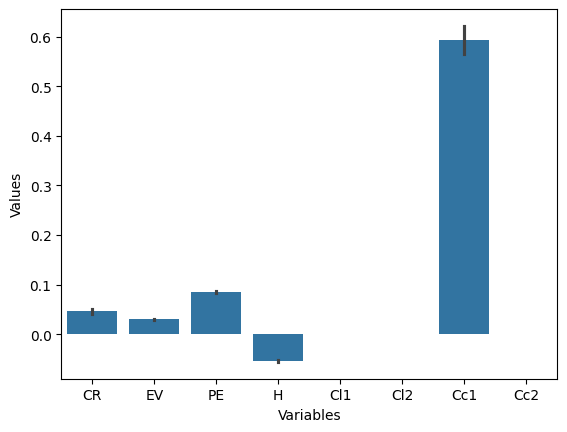

In [16]:
CR = np.mean(coefficient_totals[0])
print(coefficient_totals[0])
print(CR)
EV = np.mean(coefficient_totals[1])
PE = np.mean(coefficient_totals[2])
means =[CR, EV, PE]

variables = []
vals=[]
for i in range(0, len(coefficient_totals)):
    variables += len(coefficient_totals[i])*[collect[i]]
    vals += coefficient_totals[i]
    # print(len(coefficient_totals[i]))
    # print(len(vals))
data = {
    "Variables":variables,
    "Values":vals
}


# print(len(data["Values"]))

# print(np.median(coefficient_totals[3]))
# print(coefficient_totals[3])

print(occurences[3])
print(occurences[4])
print(occurences[6])
print(occurences[8])
print(occurences[9])

# print(len(len(coefficient_totals[0])*[collect[0]]))

# print(len(coefficient_totals[0]))

# data = {
#     "Variables":len(coefficient_totals[0])*['Cr'] + len(coefficient_totals[1])*['Ev'] + len(coefficient_totals[2])*['Pe'],
#     'Values':coefficient_totals[0] + coefficient_totals[1] + coefficient_totals[2]
# }

# plt.bar(['CR', 'EV', 'PE'], means)
sns.barplot(data=data, x ="Variables", y="Values", errorbar="se")


In [6]:
frame = pd.DataFrame(r2lists)
frame = frame.transpose()
frame.to_csv("R^2 Values.csv")

0.3072883599732058
0.2791093591792212
0.373875400459477
0.2940212105684106
0.5262276834321166
0.4901747447912046
0.3570773162665024
0.6335548075188793
0.5189201936584251
0.4993145222857214
0.2587128005293281
0.3222906596095659
0.1883081406321652
0.520291668483024
0.7728949719151306
0.4816875784523127
0.2125628986256538
0.7442905550301617
0.2796811050550767
0.412499155690733
0.3257995452917513
0.3765729915168802
0.1281135633276315
0.1105299932820875
0.3056369769332165
0.0272174062863708
0.5701845023293781
0.6334483601109122
0.5697410760258906
0.7644801312087701
0.5505032435519175
0.6487053813387365
0.2088106982820534
0.3997838044789183
0.5889348260442462
0.7246685803633384
0.570318795348379
0.3295173537161415
0.3630277670138684
0.8297550233287321
0.547075815086899
0.6648627623369896
0.0745538932583269
0.4638527435545276
0.4875989755298344
0.4165507628159692
0.4360717889822615
0.5456986229391838
0.5679419263047019
0.6876635353090763
0.7299008351744013
0.5758530342684643
0.657976882509406

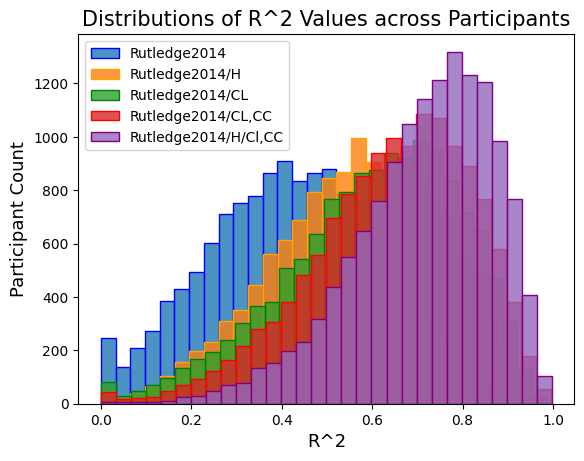

In [22]:
r2lists = pd.read_csv('R^2 Values.csv')
# print(r2lists)
# r2lists['0'] = pd.to_numeric(r2lists['0'])
# r2lists['1'] = pd.to_numeric(r2lists['1'])
# r2lists['2'] = pd.to_numeric(r2lists['2'])
# r2lists['3'] = pd.to_numeric(r2lists['3'])
# r2lists['4'] = pd.to_numeric(r2lists['4'])

newlists=[]
for i in range(0,5):
    i = r2list[str(i)]
    newlist = []
    for j in i:
        print(j)
        if j < 0:
            newlist.append(0)
        else:
            newlist.append(j)
    newlists.append(newlist)

sns.histplot(newlists[0], alpha=0.8, bins=30, edgecolor='blue',
         label='Rutledge2014')
sns.histplot(newlists[1], alpha=0.8, bins=30, edgecolor='orange',
         label='Rutledge2014/H')
sns.histplot(newlists[2], alpha=0.8, bins=30, edgecolor='green',
         label='Rutledge2014/CL')
sns.histplot(newlists[3],  alpha=0.8, bins=30, edgecolor='red',
         label='Rutledge2014/CL,CC')
sns.histplot(newlists[4],  alpha=0.8, bins=30, edgecolor='purple',
         label='Rutledge2014/H/Cl,CC')
plt.title('Distributions of R^2 Values across Participants', fontsize=15)
plt.xlabel('R^2', fontsize=13)
plt.ylabel('Participant Count', fontsize=13)

plt.legend()

data = pd.DataFrame(newlists)
data.to_csv("R^2 Values")

print(data[0])